# 1.Preset

## 1.1 Read image, set bits occupied by "Run-Length", use RGB-to-YCbCr or not and block size.

Populating the interactive namespace from numpy and matplotlib


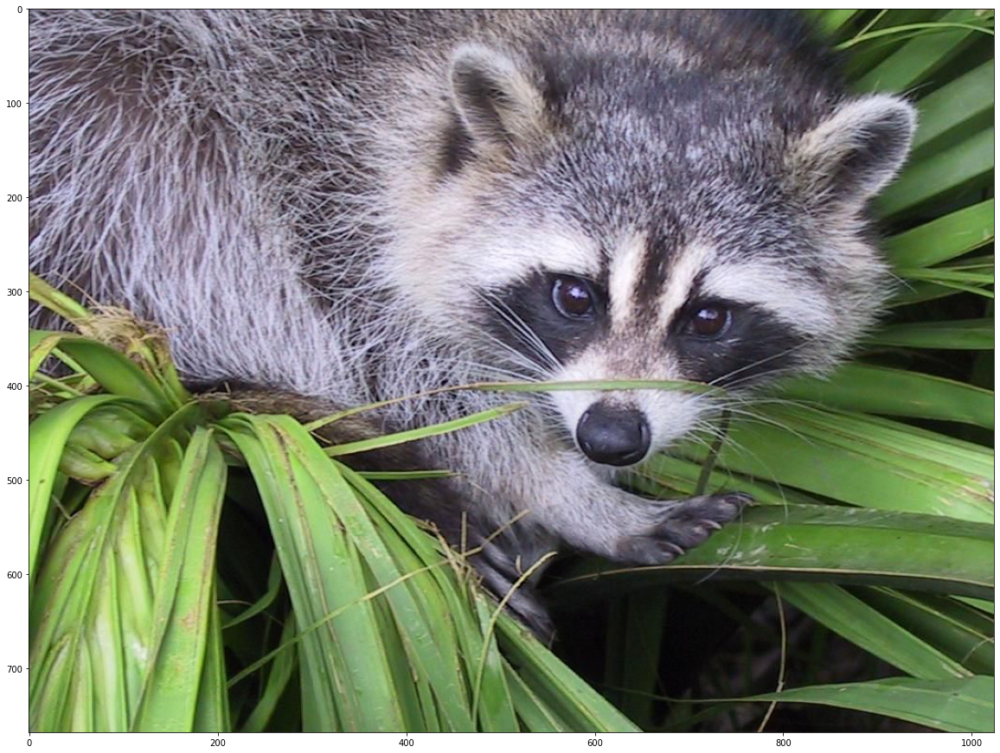

In [1]:
%pylab inline
import scipy.misc
img = scipy.misc.face()
figure(figsize=(20,20))
imshow(img)
w=8 #modify it if you want, maximal 8 due to default quantization table is 8*8
w=max(2,min(8,w))
h=w
xLen = img.shape[1]//w
yLen = img.shape[0]//h
runBits=1 #modify it if you want
bitBits=3  #modify it if you want
rbBits=runBits+bitBits ##(run,bitSize of coefficient)
useYCbCr=True #modify it if you want
useHuffman=True #modify it if you want
quantizationRatio=1 #modify it if you want, quantization table=default quantization table * quantizationRatio

## 1.2 Transfer RGB image to YCbCr Image if you want

True

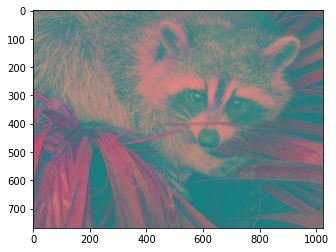

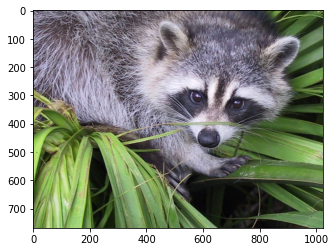

In [2]:
from skimage.color import rgb2ycbcr,ycbcr2rgb
def myYcbcr2rgb(ycbcr):
  return (ycbcr2rgb(ycbcr).clip(0,1)*255).astype(uint8)
img = scipy.misc.face()
originalImg=copy(img)
ycbcr=rgb2ycbcr(img)
rgb=myYcbcr2rgb(ycbcr)
imshow(ycbcr.astype(uint8))
figure()
imshow(rgb)
if (useYCbCr):
  img=ycbcr
allclose(rgb,originalImg,atol=1)

# 2.Transform the image into blocks

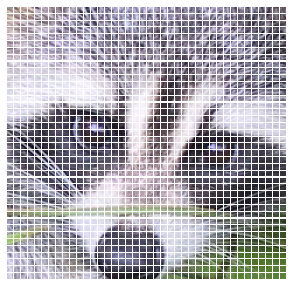

In [3]:
def toBlocks(img):
  blocks = zeros((yLen,xLen,h,w,3),dtype=int16)
  for y in range(yLen):
    for x in range(xLen):
      blocks[y][x]=img[y*h:(y+1)*h,x*w:(x+1)*w]
  return array(blocks)
blocks = toBlocks(img)

def plotBlocks(blocks,gray=False):
  xLen=blocks.shape[1]
  yLen=blocks.shape[0]
  for y in range(yLen):
    for x in range(xLen):
      subplot(yLen,xLen,1+xLen*y+x)
      imshow(blocks[y][x],cmap=cm.gray if gray else cm.Accent)
      axis('off')
x1=int(0.47*xLen)#x1,x2,y1,y2 is location of the face
y1=int(0.21*yLen)
figure(figsize=(5,5))
if(useYCbCr):
  def ycbcrBlock2rgb(block):
    return (ycbcr2rgb(block)*(255/ycbcr2rgb(block).max())).astype(uint8)
  plotBlocks(array(list(map(ycbcrBlock2rgb,blocks[y1:y1+40,x1:x1+40]))))
else:
  plotBlocks(blocks[y1:y1+40,x1:x1+40])

# 3.DCT (Discrete Cosine Transform)

## 3.1 operate DCT on all the blocks respectively, check the difference between step-2 and step-3

In [0]:
from scipy.fftpack import dct,idct
def dctOrDedctAllBlocks(blocks,type="dct"):
  f=dct if type=="dct" else idct
  dedctBlocks = zeros((yLen,xLen,h,w,3))
  for y in range(yLen):
    for x in range(xLen):
      d = zeros((h,w,3))
      for i in range(3):
        block=blocks[y][x][:,:,i]
        d[:,:,i]=f(f(block.T, norm = 'ortho').T, norm = 'ortho')
        if (type!="dct"):
          d=d.round().astype(int16)
      dedctBlocks[y][x]=d
  return dedctBlocks
dctBlocks=dctOrDedctAllBlocks(blocks,"dct")

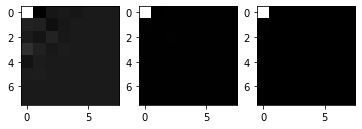

In [5]:
#dct example of one dct block's r-g-b/YCbCr channels
def exampleOnRGB(block):
  subplot(1,3,1)#red
  imshow(block[0][0][:,:,0],cmap=cm.gray)
  subplot(1,3,2)#green
  imshow(block[0][0][:,:,1],cmap=cm.gray)
  subplot(1,3,3)#blue
  imshow(block[0][0][:,:,2],cmap=cm.gray)
exampleOnRGB(dctBlocks)

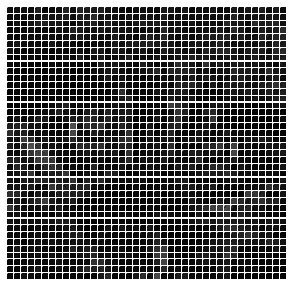

In [6]:
figure(figsize=(5,5))
redChannel=dctBlocks[:,:,:,:,0]
plotBlocks(redChannel[20:60,60:100],True)

## 3.2 Why DCT (0,0) or (0) is called DC? and why it is the most light point?

Generally, DCT is to transform a signal into Amplitudes(array of size len(signal)) of all different Frenquency
of Cosine functions whose Frequency is lower than len(signal)/2 which is called Nyquist Frequency,
 First line (y[0]) is so called DC (Direct Current) as it is flat(0Hz),
else are AC (Alternating Current) which are < Nyquist Frequency (Sampling Frequency/2 Hz)


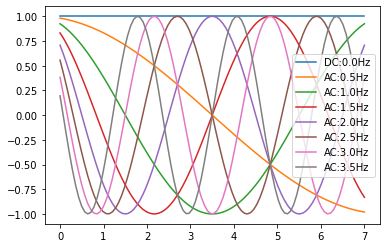

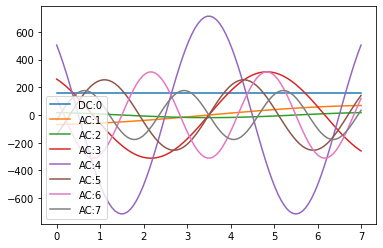

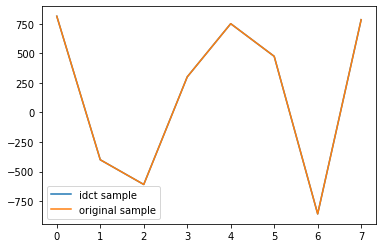

In [7]:
import random
q=8
x=random.sample(range(-1000,1000),q)
d=dct(x)
n=linspace(0,q-1,100)
y=zeros(q,dtype=object)

for k in range(q):
  y[k]=cos(pi*(2*n+1)*k/(2*q))
print("Generally, DCT is to transform a signal into Amplitudes(array of size len(signal)) of all different Frenquency\nof Cosine functions whose Frequency is lower than len(signal)/2 which is called Nyquist Frequency,\n First line (y[0]) is so called DC (Direct Current) as it is flat(0Hz),\nelse are AC (Alternating Current) which are < Nyquist Frequency (Sampling Frequency/2 Hz)")
for k in range(q):
  plot(n,y[k],label=("DC:"if k==0 else "AC:")+str(k/2)+"Hz")
legend()

figure()
for k in range(q):
  y[k]*=d[k]/q
y[0]/=2
for k in range(q):
  plot(n,y[k],label=("DC:"if k==0 else "AC:")+str(k))
legend()

figure()
n=linspace(0,q-1,q)
y=zeros(q,dtype=object)
for k in range(q):
  y[k]=cos(pi*(2*n+1)*k/(2*q))*d[k]/len(x)
y[0]/=2
y=sum(y)
plot(y,label="idct sample")
plot(x,label='original sample')
legend()


## 3.3 How it looks like transforming the DCT blocks back to image?

In [0]:
def blocks2img(blocks):
  W=xLen*w
  H=yLen*h
  img = zeros((H,W,3))
  for y in range(yLen):
    for x in range(xLen):
      img[y*h:y*h+h,x*w:x*w+w]=blocks[y][x]
  return img
newImg=blocks2img(dctBlocks)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


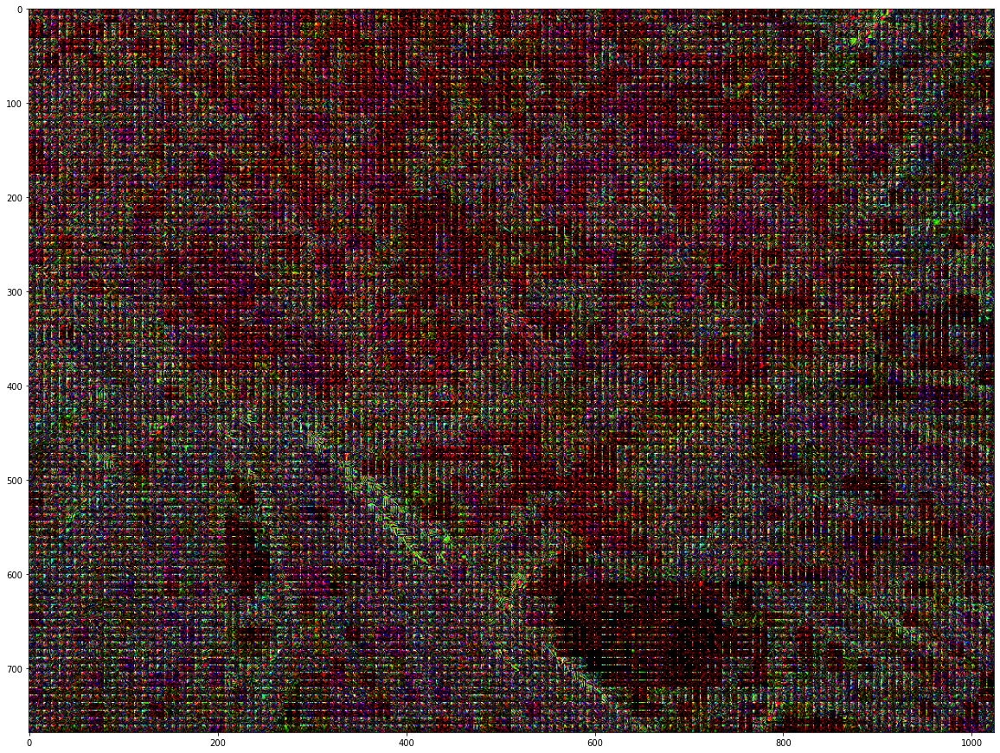

In [9]:
figure(figsize=(20,20))
imshow(newImg)

# 4.Quantized DCT(save approximations, omit details)

## 4.1 Use default quantization table(you can find it in google) to quantize all dct blocks

In [0]:
#quantization table
QY=array([[16,11,10,16,24,40,51,61],
     [12,12,14,19,26,58,60,55],
     [14,13,16,24,40,57,69,56],
     [14,17,22,29,51,87,80,62],
     [18,22,37,56,68,109,103,77],
     [24,35,55,64,81,104,113,92],
     [49,64,78,87,103,121,120,101],
     [72,92,95,98,112,100,103,99]])
QC=array([[17,18,24,47,99,99,99,99],
     [18,21,26,66,99,99,99,99],
     [24,26,56,99,99,99,99,99],
     [47,66,99,99,99,99,99,99],
     [99,99,99,99,99,99,99,99],
     [99,99,99,99,99,99,99,99],
     [99,99,99,99,99,99,99,99],
     [99,99,99,99,99,99,99,99]])
QY=QY[:w,:h]
QC=QC[:w,:h]
qDctBlocks=copy(dctBlocks)
Q3 = moveaxis(array([QY]+[QC]+[QC]),0,2)*quantizationRatio if useYCbCr else dstack([QY*quantizationRatio]*3)#all r-g-b/Y-Cb-Cr 3 channels need to be quantized
Q3=Q3*((11-w)/3)
qDctBlocks=(qDctBlocks/Q3).round().astype('int16') 

Text(0.5, 1.0, 'Quantized DCT blocks')

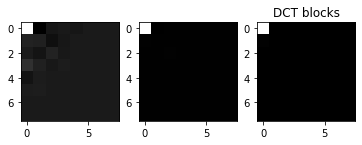

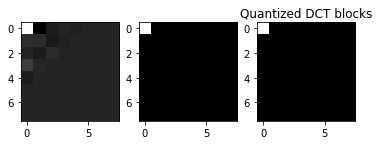

In [11]:
#dct example of one quantized dct block's r-g-b/Y-Cb-Cr channels
exampleOnRGB(dctBlocks)
title("DCT blocks")
figure()
exampleOnRGB(qDctBlocks)
title("Quantized DCT blocks")

## 4.2 Transform the quantized dct blocks back to image, check the difference between step-3.1 and step-4.2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


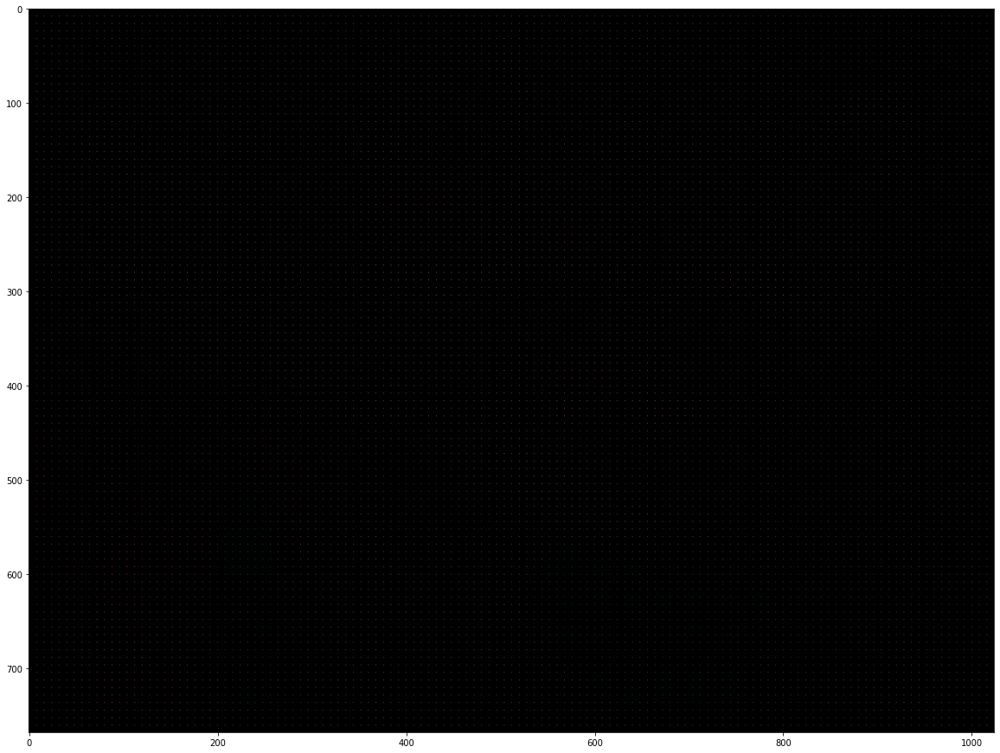

In [12]:
qDctImg=blocks2img(qDctBlocks).astype('int16')
figure(figsize=(20,20))
imshow(qDctImg)

## 4.3 Try a random bad quantization table to check the difference of result image.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


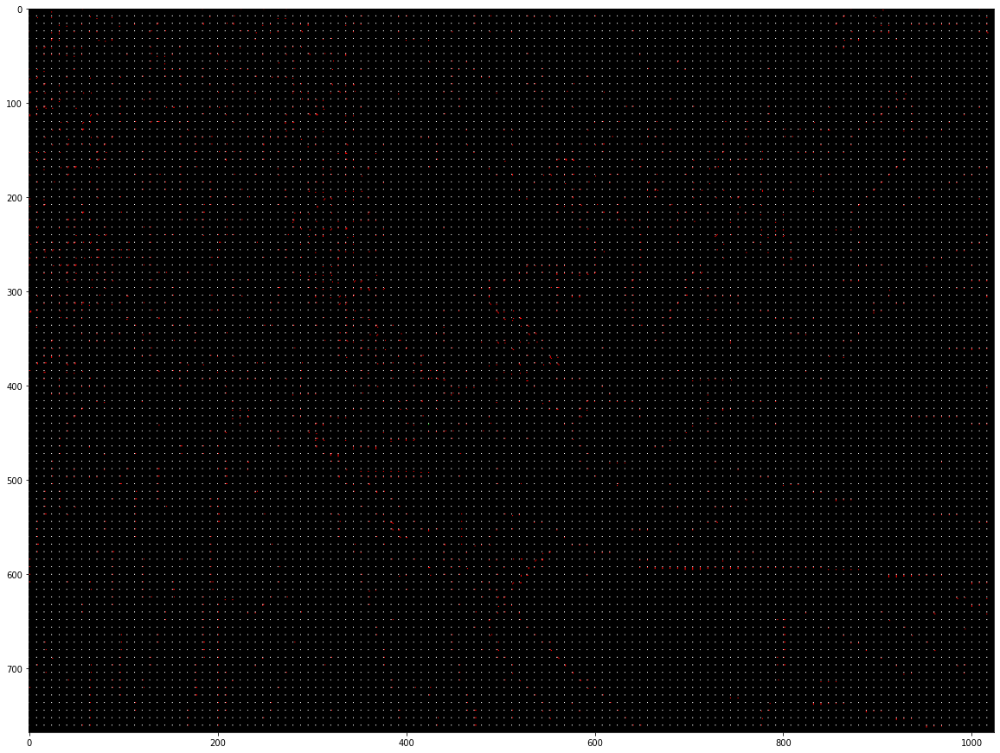

In [13]:
Qrandom=arange(200,200+w*h).reshape(w,h)
qRandDctBlocks=copy(dctBlocks)
Qr3 = dstack([Qrandom]*3)
qRandDctBlocks/=Qr3
qRandDctBlocks=qRandDctBlocks.round().astype('int16')
figure(figsize=(20,20))
imshow(blocks2img(qRandDctBlocks)) 


## 4.4 Decompression(image reconstruction) of 3 kinds of DCT(check difference)


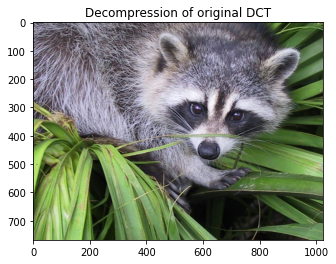

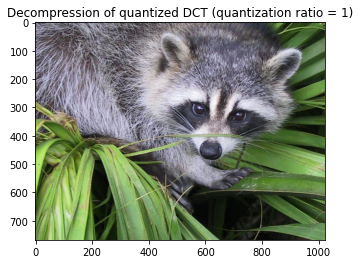

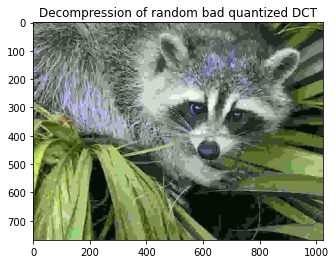

In [14]:
figure()
title("Decompression of original DCT")
dedctBlocks=dctOrDedctAllBlocks(dctBlocks,"idct")
imshow(myYcbcr2rgb(blocks2img(dedctBlocks)) if useYCbCr else blocks2img(dedctBlocks).astype(int16))
figure()
title("Decompression of quantized DCT (quantization ratio = "+str(quantizationRatio)+")")
dedctBlocks=dctOrDedctAllBlocks(qDctBlocks*Q3,"idct")
imshow(myYcbcr2rgb(blocks2img(dedctBlocks)) if useYCbCr else blocks2img(dedctBlocks).astype(int16))
figure()
title("Decompression of random bad quantized DCT")
dedctBlocks=dctOrDedctAllBlocks(qRandDctBlocks*Qr3,"idct")
imshow(myYcbcr2rgb(blocks2img(dedctBlocks)) if useYCbCr else blocks2img(dedctBlocks).astype(int16))

# 5.Example of saving one quantized DCT block as small size as it can be


## 5.1 Zig-Zag process

In [15]:
def zigZag(block):
  lines=[[] for i in range(h+w-1)] 
  for y in range(h): 
    for x in range(w): 
      i=y+x 
      if(i%2 ==0): 
          lines[i].insert(0,block[y][x]) 
      else:  
          lines[i].append(block[y][x]) 
  return array([coefficient for line in lines for coefficient in line])
print(qDctBlocks[0][0][:,:,0])
zigZag(qDctBlocks[0][0][:,:,0])

[[ 61 -10  -2   0  -1   0   0   0]
 [  3   2  -3  -1   0   0   0   0]
 [  0  -2   2   0   0   0   0   0]
 [  7   1   0   0   0   0   0   0]
 [ -2   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0]]


array([ 61, -10,   3,   0,   2,  -2,   0,  -3,  -2,   7,  -2,   1,   2,
        -1,  -1,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
      dtype=int16)

## 5.2 Huffman Coding

In [16]:
!pip install huffman
import huffman
from collections import Counter
def huffmanCounter(zigZagArr):
  rbCount=[]
  run=0
  for AC in zigZagArr[1:]:
    if(AC!=0):
      AC=max(AC,1-2**(2**bitBits-1)) if AC<0 else min(AC,2**(2**bitBits-1)-1)
      if(run>2**runBits-1):
        runGap=2**runBits
        k=run//runGap
        for i in range(k):
          rbCount.append('1'*runBits+'0'*bitBits)
        run-=k*runGap
      run=min(run,2**runBits-1) 
      bitSize=min(int(ceil(log(abs(AC)+0.000000001)/log(2))),2**bitBits-1)
      rbCount.append(format(run<<bitBits|bitSize,'0'+str(rbBits)+'b'))
      run=0
    else:
      run+=1
  rbCount.append("0"*(rbBits))
  return Counter(rbCount)
rbCount=zeros(3,dtype=Counter)
rbCount[0]=huffmanCounter(zigZag(qDctBlocks[0][0][:,:,0]))
rbCount[1]=huffmanCounter(zigZag(qDctBlocks[0][0][:,:,1]))
rbCount[2]=huffmanCounter(zigZag(qDctBlocks[0][0][:,:,2]))
rbCount=sum(rbCount)
print("(run,bit) counter for Huffman Coding:\n"+str(rbCount))
print("Huffman Coding:\n"+str(huffman.codebook(rbCount.items())))


(run,bit) counter for Huffman Coding:
Counter({'0010': 5, '0001': 3, '0000': 3, '1010': 2, '0100': 1, '0011': 1})
Huffman Coding:
{'0100': '1011', '0010': '11', '1010': '100', '0011': '1010', '0001': '01', '0000': '00'}


## 5.3 Run-Length encoding(with VLI Variable-length-integer encoding)
![VLI](https://github.com/timmmGZ/JPEG-DCT-Compression/blob/master/images/VLI.jpg?raw=true)

In [17]:
#Show run-length in a readable way
def runLengthReadable(zigZagArr,lastDC):
  rlc=[]
  run=0
  newDC=min(zigZagArr[0],2**(2**bitBits-1)-1)
  DC=newDC-lastDC
  bitSize=max(0,min(int(ceil(log(abs(DC)+0.000000001)/log(2))),2**bitBits-1))
  rlc.append([array(bitSize),DC])
  code=format(bitSize, '0'+str(bitBits)+'b')+"\n"
  if (bitSize>0):
    code=code[:-1]+","+(format(DC,"b") if DC>0 else ''.join([str((int(b)^1)) for b in format(abs(DC),"b")]))+"\n"
  for AC in zigZagArr[1:]:
    if(AC!=0):
      AC=max(AC,1-2**(2**bitBits-1)) if AC<0 else min(AC,2**(2**bitBits-1)-1)
      if(run>2**runBits-1):
        runGap=2**runBits
        k=run//runGap
        for i in range(k):
          code+='1'*runBits+'0'*bitBits+'\n'
          rlc.append([runGap-1,0])
        run-=k*runGap
      bitSize=min(int(ceil(log(abs(AC)+0.000000001)/log(2))),2**bitBits-1)
      #VLI encoding (next 2 lines of codes)
      code+=format(run<<bitBits|bitSize,'0'+str(rbBits)+'b')+','
      code+=(format(AC,"b") if AC>=0 else ''.join([str((int(b)^1)) for b in format(abs(AC),"b")]))+"\n"
      rs=zeros(1,dtype=object)
      rs[0]=array([run,bitSize])
      rs= append(rs,AC)
      rlc.append(rs)
      run=0
    else:
      run+=1
  rlc.append([0,0])
  code+="0"*(rbBits)#end
  return array(rlc),code,newDC
b=zeros(64,dtype=int16)
b[0]=222
b[4]=9
b[11]=33
b[12]=25
b[14]=-129
b[17]=77
b[27]=12
b[47]=82
print(b)
arr,code,DC=runLengthReadable(b,0)
print("DC of this block is: "+str(DC)+" (maximal=2^(2^bitBits)/2)")
print("Defualt:Run and bitSize both occupies 4 bits, so need a byte in total to store them\nColumns: run(0s-gap)|bits needed for coefficient|coefficient")
print(arr)
print("Run-Length code(using VLI):\n"+str(code))


[ 222    0    0    0    9    0    0    0    0    0    0   33   25    0
 -129    0    0   77    0    0    0    0    0    0    0    0    0   12
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0   82    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0]
DC of this block is: 127 (maximal=2^(2^bitBits)/2)
Defualt:Run and bitSize both occupies 4 bits, so need a byte in total to store them
Columns: run(0s-gap)|bits needed for coefficient|coefficient
[[array(7) 127]
 [1 0]
 [array([1, 4]) 9]
 [1 0]
 [1 0]
 [1 0]
 [array([0, 6]) 33]
 [array([0, 5]) 25]
 [array([1, 7]) -127]
 [1 0]
 [array([0, 7]) 77]
 [1 0]
 [1 0]
 [1 0]
 [1 0]
 [array([1, 4]) 12]
 [1 0]
 [1 0]
 [1 0]
 [1 0]
 [1 0]
 [1 0]
 [1 0]
 [1 0]
 [1 0]
 [array([1, 7]) 82]
 [0 0]]
Run-Length code(using VLI):
111,1111111
1000
1100,1001
1000
1000
1000
0110,100001
0101,11001
1111,0000000
1000
0111,1001101
1000
1000
1000
1000
1100,1100
1000
1000
1000
1000
1000
1000
100

In [18]:
def runLength(zigZagArr,lastDC,hfm=None):
  rlc=[]
  run=0
  newDC=min(zigZagArr[0],2**(2**bitBits-1))
  DC=newDC-lastDC
  bitSize=max(0,min(int(ceil(log(abs(DC)+0.000000001)/log(2))),2**bitBits-1))
  code=format(bitSize, '0'+str(bitBits)+'b')
  if (bitSize>0):
   code+=(format(DC,"b") if DC>0 else ''.join([str((int(b)^1)) for b in format(abs(DC),"b")]))
  for AC in zigZagArr[1:]:
    if(AC!=0):
      AC=max(AC,1-2**(2**bitBits-1)) if AC<0 else min(AC,2**(2**bitBits-1)-1)
      if(run>2**runBits-1):
        runGap=2**runBits
        k=run//runGap
        for i in range(k):
          code+=('1'*runBits+'0'*bitBits)if hfm == None else  hfm['1'*runBits+'0'*bitBits]#end
        run-=k*runGap
      run=min(run,2**runBits-1) 
      bitSize=min(int(ceil(log(abs(AC)+0.000000001)/log(2))),2**bitBits-1)
      rb=format(run<<bitBits|bitSize,'0'+str(rbBits)+'b') if hfm == None else hfm[format(run<<bitBits|bitSize,'0'+str(rbBits)+'b')]
      code+=rb+(format(AC,"b") if AC>=0 else ''.join([str((int(b)^1)) for b in format(abs(AC),"b")]))
      run=0
    else:
      run+=1
  code+="0"*(rbBits) if hfm == None else  hfm["0"*(rbBits)]#end
  return code,newDC
code1,DC=runLength(zigZag(qDctBlocks[0][0][:,:,0]),0)
code2,DC=runLength(zigZag(qDctBlocks[0][0][:,:,1]),DC)
code3,DC=runLength(zigZag(qDctBlocks[0][0][:,:,2]),DC)
codeBlock=code1+code2+code3
print(codeBlock+"\nCompresion size of this block: "+str(len(codeBlock)/8)+"KB\nOriginal size of one block: "+str(w*h*3)+"KB")

11011110101000101001011101010001001101000001001001111100100100011001010000100001000000101100000110110000
Compresion size of this block: 13.0KB
Original size of one block: 192KB


## 5.4 Save the result of Run-Length to bytes

In [19]:
def runLength2bytes(code):
  return bytes([len(code)%8]+[int(code[i:i+8],2) for i in range(0, len(code), 8)])
#Following shows example of the saving and loading process of a block
print(codeBlock+"\n↓Encoding: split by length 8 ")
print(str([codeBlock[i:i+8] for i in range(0, len(codeBlock), 8)])+"\n↓Transfer to int8 ")
print(str([int(codeBlock[i:i+8],2) for i in range(0, len(codeBlock), 8)])+"\n↓Save as bytes ")
code2bytes=runLength2bytes(codeBlock)
print(str(code2bytes)+"\n↓Decoding: load as int8 ")
print(str(list(code2bytes))+"\n↓Transfer to bytes(binary)")
print(str([format(i,'08b') for i in list(code2bytes)])+"\n↓Join them")
bytes2code="".join([format(i,'08b') for i in list(code2bytes)])
print(bytes2code)

11011110101000101001011101010001001101000001001001111100100100011001010000100001000000101100000110110000
↓Encoding: split by length 8 
['11011110', '10100010', '10010111', '01010001', '00110100', '00010010', '01111100', '10010001', '10010100', '00100001', '00000010', '11000001', '10110000']
↓Transfer to int8 
[222, 162, 151, 81, 52, 18, 124, 145, 148, 33, 2, 193, 176]
↓Save as bytes 
b'\x00\xde\xa2\x97Q4\x12|\x91\x94!\x02\xc1\xb0'
↓Decoding: load as int8 
[0, 222, 162, 151, 81, 52, 18, 124, 145, 148, 33, 2, 193, 176]
↓Transfer to bytes(binary)
['00000000', '11011110', '10100010', '10010111', '01010001', '00110100', '00010010', '01111100', '10010001', '10010100', '00100001', '00000010', '11000001', '10110000']
↓Join them
0000000011011110101000101001011101010001001101000001001001111100100100011001010000100001000000101100000110110000


#6.Saving as jpeg, do step-5 for all blocks of the image

In [20]:
def huffmanCounterWholeImg(blocks):
  rbCount=zeros(xLen*yLen*3,dtype=Counter)
  zz=zeros(xLen*yLen*3,dtype=object)
  for y in range(yLen):
    for x in range(xLen):
      for i in range(3):
        zz[y*xLen*3+x*3+i]=zigZag(blocks[y, x,:,:,i])
        rbCount[y*xLen*3+x*3+i]=huffmanCounter(zz[y*xLen*3+x*3+i])
  return sum(rbCount),zz
rbCount,zz=huffmanCounterWholeImg(qDctBlocks)
hfm=huffman.codebook(rbCount.items())
sortedHfm=[[hfm[i[0]],i[0],rbCount[i[0]]] for i in rbCount.most_common()]
sortedHfm

[['01', '0001', 37498],
 ['00', '0000', 36864],
 ['110', '0010', 26819],
 ['101', '1000', 24740],
 ['100', '0011', 15050],
 ['1111', '1001', 15021],
 ['11100', '1010', 5628],
 ['111011', '0100', 5192],
 ['1110101', '1011', 1729],
 ['11101001', '0101', 738],
 ['111010001', '1100', 315],
 ['1110100001', '1101', 35],
 ['1110100000', '0110', 26]]

In [21]:
print("(run,bit) occupies: "+str(sum(array(rbCount.most_common(),dtype=int32)[:,1]*rbBits)/8/2**10)+"KB")
print("(run,bit) after Huffman Coding occupies: "+str(sum([rbCount[k]*len(v) for k,v in hfm.items()])/8/2**10)+"KB")

(run,bit) occupies: 82.83935546875KB
(run,bit) after Huffman Coding occupies: 59.7386474609375KB


In [22]:
def savingQuantizedDctBlocks(blocks):
  rbCount,zigZag=huffmanCounterWholeImg(blocks)
  hfm=huffman.codebook(rbCount.items())
  sortedHfm=[[hfm[i[0]],i[0]] for i in rbCount.most_common()]
  code=""
  DC=0
  for y in range(yLen):
    for x in range(xLen):
      for i in range(3):
        codeNew,DC=runLength(zigZag[y*xLen*3+x*3+i],DC,hfm if useHuffman else None)
        code+=codeNew
  savedImg=runLength2bytes(code)
  print(str(code[:100])+"......")
  print(str(savedImg[:20])+"......")
  print("Image original size:    %.3f MB"%(img.size/(2**20)))
  print("Compression image size: %.3f MB"%(len(savedImg)/2**20))
  print("Compression ratio:      %.2f : 1"%(img.size/2**20/(len(savedImg)/2**20)))
  return bytes([int(format(xLen,'012b')[:8],2),int(format(xLen,'012b')[8:]+format(yLen,'012b')[:4],2),int(format(yLen,'012b')[4:],2)])+savedImg,sortedHfm
import time
t1=time.time()
savedImg,sortedHfmForDecode=savingQuantizedDctBlocks(qDctBlocks)
t2=time.time()
print("Encoding: "+str(t2-t1)+" seconds")
save = open("img.bin", "wb")
save.write(savedImg)
save.close()

1101111011110110101110111110010110011110000110011001111100101111010010010000101100011011000110011110......
b'\x07\xde\xf6\xbb\xe5\x9e\x19\x9f/I\x0b\x1b\x19\xef%\xd4:\xbd\xc7o'......
Image original size:    2.250 MB
Compression image size: 0.110 MB
Compression ratio:      20.41 : 1
Encoding: 12.375141859054565 seconds


1001100111010110111011010011111000110001000010111011010111110110111001101110101111110010100001000100......
b'\x00\x99\xd6\xed>1\x0b\xb5\xf6\xe6\xeb\xf2\x84D\x9d{m\x0e\x08\x8e'......
Image original size:    2.250 MB
Compression image size: 0.047 MB
Compression ratio:      47.76 : 1


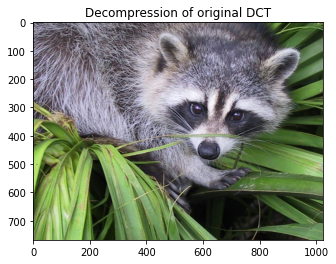

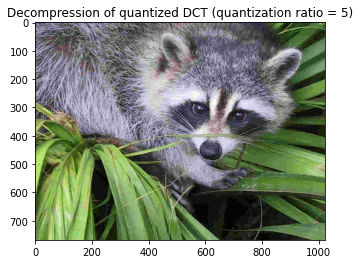

In [23]:
#try quantizationRatio=5
qr=5
qDctBlocks5=copy(dctBlocks)
Q3_5 = Q3*qr
qDctBlocks5=(qDctBlocks5/Q3_5).round().astype('int16')

figure()
title("Decompression of original DCT")
dedctBlocks=dctOrDedctAllBlocks(dctBlocks,"idct")
imshow(myYcbcr2rgb(blocks2img(dedctBlocks)) if useYCbCr else blocks2img(dedctBlocks).astype(int16))
figure()
title("Decompression of quantized DCT (quantization ratio = "+str(qr)+")")
dedctBlocks=dctOrDedctAllBlocks(qDctBlocks5*Q3_5,"idct")
imshow(myYcbcr2rgb(blocks2img(dedctBlocks)) if useYCbCr else blocks2img(dedctBlocks).astype(int16))

savedImg1,rbCount1=savingQuantizedDctBlocks(qDctBlocks5)
save = open("img5foldCompression.bin", "wb")
save.write(savedImg1)
save.close()

# 7.Decoding

## 7.1 Run-Length decoding

In [0]:
def bytes2runLength(bytes):
  return "".join([format(i,'08b') for i in list(bytes)][1:-1 if list(bytes)[-1]!=0 else None])+(format(list(bytes)[-1],'0'+str(list(bytes)[0])+'b')if list(bytes)[-1]!=0 else"")

## 7.2 Zig-Zag decoding

In [0]:
gaps=[i for i in range(1,8)]+[8-i for i in range(8)]+[-1]
locations=[[int(sum(range(gaps[i-1]+1))),sum(range(gaps[i]+1))] if gaps[i]>gaps[i-1]  else [64-sum(range(gaps[i-1])),64-sum(range(gaps[i]))] for i in range(len(gaps)-1)]
def deZigZag(zigZagArr):
  zigZagArr=[zigZagArr[l[0]:l[1]] for l in locations]
  block=zeros((h,w),dtype=int16)
  for y in range(h): 
    for x in range(w): 
      i=y+x 
      if(i%2 != 0): 
        block[y][x]=zigZagArr[i][0]
        zigZagArr[i]=zigZagArr[i][1:]
      else: 
        block[y][x]=zigZagArr[i][-1:][0]
        zigZagArr[i]=zigZagArr[i][:-1]
  return block

In [26]:
#explaination of above section of codes
z=zigZag(qDctBlocks[0][0][:,:,0])
print("1. Orignial Zig-Zag block:\n"+str(z))
gaps=[ i for i in range(1,w)]+[w-i for i in range(w)]+[-1]
print("2. Transfer the form as [[]] with this length of gap("+str(gaps[:-1])+"):")
locations=[[int(sum(range(gaps[i-1]+1))),sum(range(gaps[i]+1))] if gaps[i]>gaps[i-1]  else [w*h-sum(range(gaps[i-1])),w*h-sum(range(gaps[i]))] for i in range(len(gaps)-1)]
print(locations)
zz1=[z[l[0]:l[1]] for l in locations]
for i in range(len(zz1)): 
  print(zz1[i])
print("3. The quantized DCT (ZigZag decoding):\n"+str(deZigZag(z)))

1. Orignial Zig-Zag block:
[ 61 -10   3   0   2  -2   0  -3  -2   7  -2   1   2  -1  -1   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
2. Transfer the form as [[]] with this length of gap([1, 2, 3, 4, 5, 6, 7, 8, 7, 6, 5, 4, 3, 2, 1]):
[[0, 1], [1, 3], [3, 6], [6, 10], [10, 15], [15, 21], [21, 28], [28, 36], [36, 43], [43, 49], [49, 54], [54, 58], [58, 61], [61, 63], [63, 64]]
[61]
[-10   3]
[ 0  2 -2]
[ 0 -3 -2  7]
[-2  1  2 -1 -1]
[0 0 0 0 0 0]
[0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0]
[0 0 0 0 0 0]
[0 0 0 0 0]
[0 0 0 0]
[0 0 0]
[0 0]
[0]
3. The quantized DCT (ZigZag decoding):
[[ 61 -10  -2   0  -1   0   0   0]
 [  3   2  -3  -1   0   0   0   0]
 [  0  -2   2   0   0   0   0   0]
 [  7   1   0   0   0   0   0   0]
 [ -2   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0]
 [  0  

### 7.2.1 Another Zig-Zag Decoding

In [27]:
if(w%2==0):
  x=concatenate([append(arange(0,i),arange(0,i)[::-1][1:]) for i in range(2,w+1,2)])
  x=append(x,(w-1-x[::-1])[w:])
  y=concatenate([append(arange(0,i),arange(0,i)[::-1][1:]) for i in range(1,w+1,2)])
  y=append(append(y,arange(0,h)),(h-1-y[::-1]))
else:
  x=concatenate([append(arange(0,i),arange(0,i)[::-1][1:]) for i in range(2,w,2)])
  x=append(append(x,arange(0,w)),w-1-x[::-1])
  y=concatenate([append(arange(0,i),arange(0,i)[::-1][1:]) for i in range(1,w+2,2)])
  y=append(y[:-w],w-1-y[::-1])
zzLine=dstack([x]+[y])[0]
zzMatrix=zeros((w,h),dtype=int8)
for i in range(len(zzLine)):
  zzMatrix[zzLine[i][1]][zzLine[i][0]]=i
print("Zig-Zag Matrix:\n"+str(zzMatrix))

Zig-Zag Matrix:
[[ 0  1  5  6 14 15 27 28]
 [ 2  4  7 13 16 26 29 42]
 [ 3  8 12 17 25 30 41 43]
 [ 9 11 18 24 31 40 44 53]
 [10 19 23 32 39 45 52 54]
 [20 22 33 38 46 51 55 60]
 [21 34 37 47 50 56 59 61]
 [35 36 48 49 57 58 62 63]]


In [28]:
def deZigZag2(zigZagArr):
  block=zeros((h,w),dtype=int16)
  for i in range(len(zzLine)):
    block[zzLine[i][1],zzLine[i][0]]=zigZagArr[i]
  return block
deZigZag2(zigZag(qDctBlocks[0][0][:,:,0]))

array([[ 61, -10,  -2,   0,  -1,   0,   0,   0],
       [  3,   2,  -3,  -1,   0,   0,   0,   0],
       [  0,  -2,   2,   0,   0,   0,   0,   0],
       [  7,   1,   0,   0,   0,   0,   0,   0],
       [ -2,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0]], dtype=int16)

# 8.Loading the jpeg, decompression of compressed(encoded) image

In [29]:
load = open("img.bin", "rb")
loadedbytes = load.read()
code=bytes2runLength(loadedbytes[2:])
print(str(code[:100])+"......")

0000011111011110111101101011101111100101100111100001100110011111001011110100100100001011000110110001......


In [30]:
def loadingQuantizedDctBlocks(loadedbytes,sortedHfm=None):
  runMax=2**runBits-1
  xLen=int(format(loadedbytes[0],'b')+format(loadedbytes[1],'08b')[:4],2)
  yLen=int(format(loadedbytes[1],'08b')[4:]+format(loadedbytes[2],'08b'),2)
  code=bytes2runLength(loadedbytes[3:])
  blocks = zeros((yLen,xLen,h,w,3),dtype=int16)
  lastDC=0
  rbBitsTmp=rbBits
  rbTmp=""
  cursor=0 #don't use code=code[index:] to remove readed strings when len(String) is large like 1,000,000. It will be extremely slow
  for y in range(yLen):
    for x in range(xLen):
      for i in range(3):
        zz=zeros(64)
        bitSize=int(code[cursor:cursor+bitBits],2)
        DC=code[cursor+bitBits:cursor+bitBits+bitSize]
        DC=(int(DC,2) if DC[0]=="1" else -int(''.join([str((int(b)^1)) for b in DC]),2)) if bitSize>0 else 0
        cursor+=(bitBits+bitSize)
        zz[0]=DC+lastDC
        lastDC=zz[0]
        r=1
        while(True):
          if(sortedHfm!=None):
            for ii in sortedHfm:
              if (ii[0]==code[cursor:cursor+len(ii[0])]):
                rbTmp=ii[1]
                rbBitsTmp=len(ii[0])
                break
            run=int(rbTmp[:runBits],2)
            bitSize=int(rbTmp[runBits:],2)
          else:
            run=int(code[cursor:cursor+runBits],2)
            bitSize=int(code[cursor+runBits:cursor+rbBitsTmp],2)
          if (bitSize==0):
            cursor+=rbBitsTmp
            if(run==runMax):
              r+=(run+1)
              continue
            else:
              break
          coefficient=code[cursor+rbBitsTmp:cursor+rbBitsTmp+bitSize]
          if(coefficient[0]=="0"):
            coefficient=-int(''.join([str((int(b)^1)) for b in coefficient]),2)
          else:
            coefficient=int(coefficient,2)
          zz[r+run]=coefficient
          r+=(run+1)
          cursor+=rbBitsTmp+bitSize    
        blocks[y,x,...,i]=deZigZag2(zz)
  return blocks
t1=time.time()
loadedBlocks=loadingQuantizedDctBlocks(loadedbytes,sortedHfmForDecode if useHuffman else None)
t2=time.time()
print("Decoding: "+str(t2-t1)+" seconds")

Decoding: 2.526656150817871 seconds


In [31]:
incorrect=qDctBlocks.size-count_nonzero((qDctBlocks==loadedBlocks)==True)
print("Incorrect count due to bit size of [run("+str(runBits)+"bits),bitSize("+str(bitBits)+"bits)]: \n"+str(incorrect)+" out of "+str(qDctBlocks.size))

Incorrect count due to bit size of [run(1bits),bitSize(3bits)]: 
0 out of 2359296


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


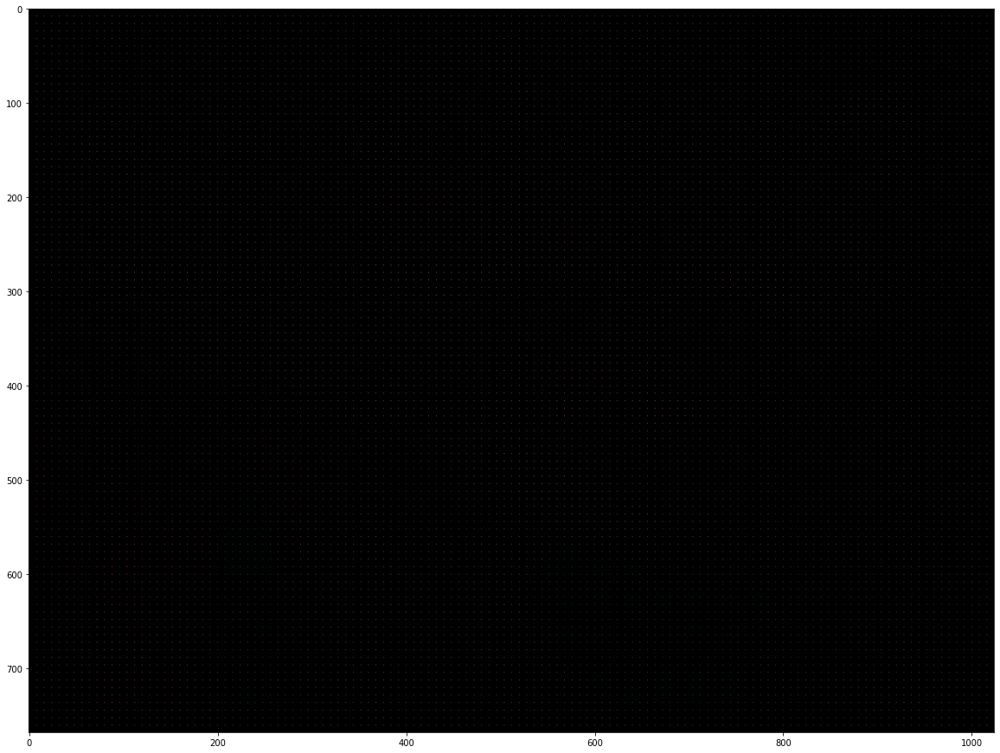

In [32]:
loadedDctImg=blocks2img(loadedBlocks)
figure(figsize=(20,20))
imshow(loadedDctImg.astype(int16))

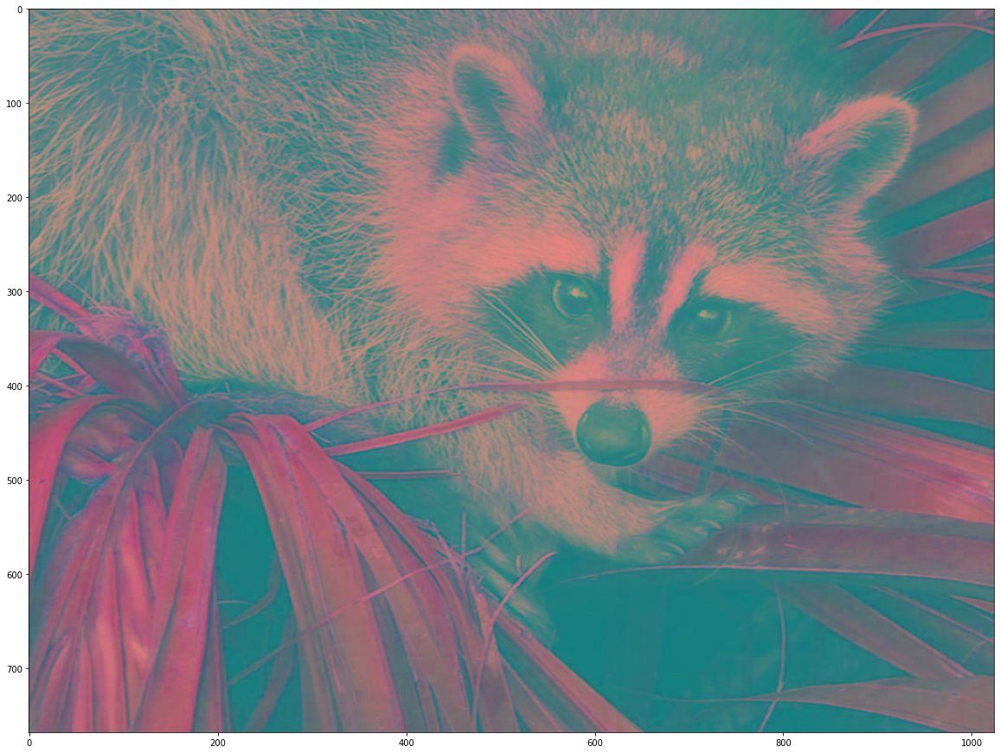

In [33]:
deDctLoadedBlocks=dctOrDedctAllBlocks(loadedBlocks*Q3,"idct")
loadedImg=blocks2img(deDctLoadedBlocks)
figure(figsize=(20,20))
imshow(loadedImg.astype(uint8))

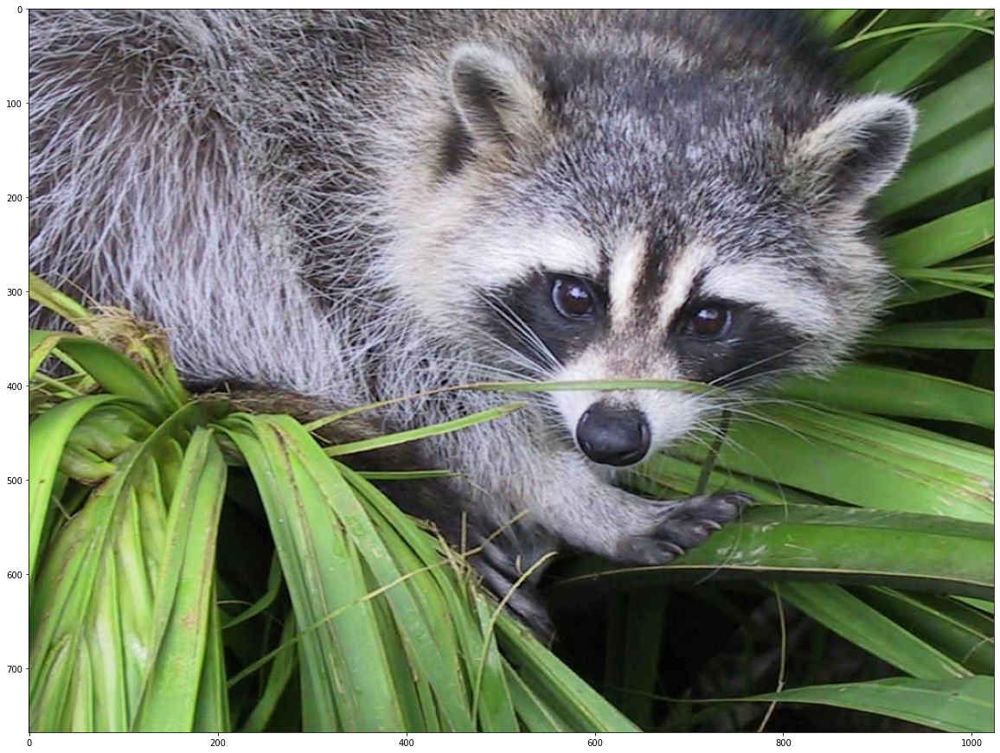

In [34]:
figure(figsize=(20,20))
imshow(myYcbcr2rgb(loadedImg) if useYCbCr else blocks2img(dedctBlocks).astype(int16))

# PS: What is Detail or Approximation?

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.6/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['save', 'random', 'qr', 'load']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: divide by zero encountered in log
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:36: RuntimeWarning: divide by zero encountered in log


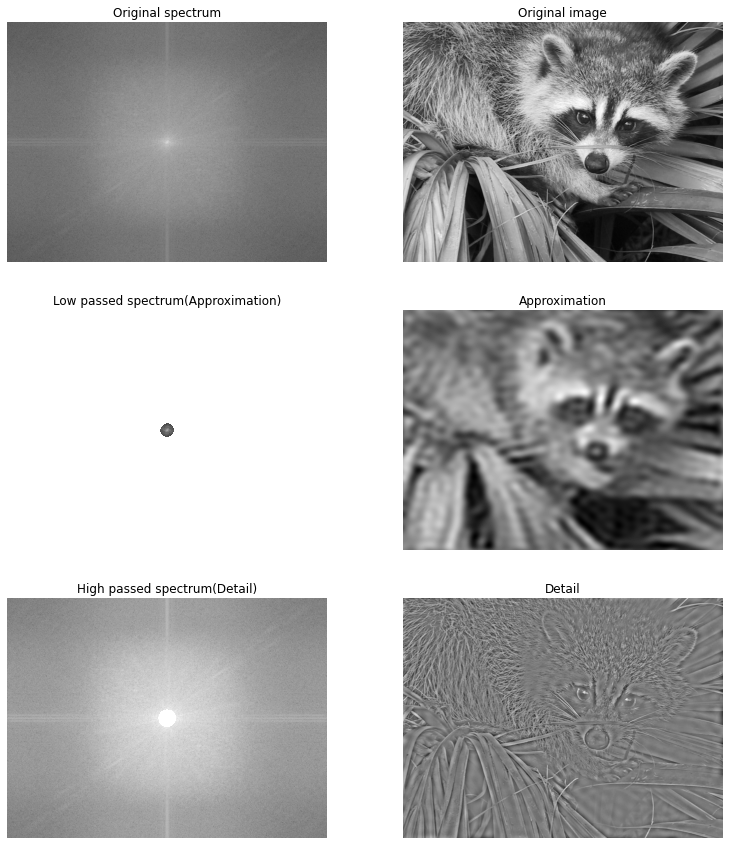

In [35]:
%pylab inline
import scipy.misc
from skimage import  color,  morphology

fig, ax = subplots(3, 2)
fig.set_size_inches((13,15))
[axi.set_axis_off() for axi in ax.ravel()]

img1= scipy.misc.face()
img1=color.rgb2gray(img1)
ax[0][1].title.set_text('Original image')
ax[0][1].imshow(img1,cmap=cm.gray)

f=fftshift(fft2(img1))
ax[0][0].title.set_text('Original spectrum')
ax[0][0].imshow(log(abs(f)),cmap=cm.gray)

mask=zeros(img1.shape)
d=morphology.disk(25)
Cx=mask.shape[0]//2
Cy=mask.shape[1]//2
Dx=d.shape[0]//2
Dy=d.shape[1]//2
mask[Cx-Dx:Cx+Dx+1,Cy-Dy:Cy+Dy+1]=d

approximation=f*mask
ax[1][0].title.set_text('Low passed spectrum(Approximation)')
ax[1][0].imshow(log(abs(approximation)),cmap=cm.gray)

ifftApproximation=ifft2(fftshift(approximation))
ax[1][1].title.set_text('Approximation')
ax[1][1].imshow(ifftApproximation.real,cmap=cm.gray)

detail=f*(1-mask)
ax[2][0].title.set_text('High passed spectrum(Detail)')
ax[2][0].imshow(log(abs(detail)),cmap=cm.gray)

ifftDetail=fftshift(detail)
ifftDetail=ifft2(ifftDetail)
ax[2][1].title.set_text('Detail')
ax[2][1].imshow(ifftDetail.real,cmap=cm.gray)

